In [119]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 

In [120]:
df=pd.read_csv("/content/Bias_correction_ucl (1).csv",parse_dates=['Date'])
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.000000,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.000000,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.000000,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.000000,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.000000,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,2017-08-30,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,0.030034,0.081035,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,2017-08-30,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,0.035874,0.074962,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,2017-08-30,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,0.048954,0.059869,0.000000,0.000796,0.000000,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaT,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


In [121]:
df.shape

(7752, 25)

In [122]:
df.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

In [123]:
df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [124]:
df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7750.000000,7682.000000,7682.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7725.000000,7725.000000
mean,13.000000,29.768211,23.225059,56.759372,88.374804,29.613447,23.512589,7.097875,62.505019,0.368774,0.356080,0.318404,0.299191,0.591995,0.485003,0.278200,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220
std,7.211568,2.969999,2.413961,14.668111,7.192004,2.947191,2.345347,2.183836,33.730589,0.262458,0.258061,0.250362,0.254348,1.945768,1.762807,1.161809,1.206214,0.050352,0.079435,54.279780,1.370444,429.158867,3.128010,2.487613
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000
25%,7.000000,27.800000,21.700000,45.963543,84.222862,27.673499,22.089739,5.678705,37.266753,0.146654,0.140615,0.101388,0.081532,0.000000,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.300000
50%,13.000000,29.900000,23.400000,55.039024,89.793480,29.703426,23.760199,6.547470,56.865482,0.315697,0.312421,0.262555,0.227664,0.000000,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000
75%,19.000000,32.000000,24.900000,67.190056,93.743629,31.710450,25.152909,8.032276,84.223616,0.575489,0.558694,0.496703,0.499489,0.052525,0.018364,0.007896,0.000041,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,0.968353,0.983789,0.974710,23.701544,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000


In [125]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   station           7750 non-null   float64       
 1   Date              7750 non-null   datetime64[ns]
 2   Present_Tmax      7682 non-null   float64       
 3   Present_Tmin      7682 non-null   float64       
 4   LDAPS_RHmin       7677 non-null   float64       
 5   LDAPS_RHmax       7677 non-null   float64       
 6   LDAPS_Tmax_lapse  7677 non-null   float64       
 7   LDAPS_Tmin_lapse  7677 non-null   float64       
 8   LDAPS_WS          7677 non-null   float64       
 9   LDAPS_LH          7677 non-null   float64       
 10  LDAPS_CC1         7677 non-null   float64       
 11  LDAPS_CC2         7677 non-null   float64       
 12  LDAPS_CC3         7677 non-null   float64       
 13  LDAPS_CC4         7677 non-null   float64       
 14  LDAPS_PPT1        7677 n

In [126]:
# Filling nullvalue with mean
df[df.columns]=df[df.columns].fillna(df.mean())

In [127]:
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.000000,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.000000,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.000000,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.000000,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.000000,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,2017-08-30,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,0.030034,0.081035,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,2017-08-30,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,0.035874,0.074962,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,2017-08-30,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,0.048954,0.059869,0.000000,0.000796,0.000000,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,13.0,NaT,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


In [128]:
df.drop([7750,7751],inplace=True)

In [129]:
df.shift(-3)

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
1,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5
2,6.0,2013-06-30,31.9,23.5,52.437126,85.307251,29.219342,23.822613,6.182295,50.231389,0.185279,0.280818,0.232841,0.146363,0.0,0.0,0.0,0.0,37.5102,127.042,54.6384,0.1457,5873.780762,31.5,24.0
3,7.0,2013-06-30,31.4,24.4,56.287189,81.019760,28.551859,24.238467,5.587135,125.110007,0.389600,0.333570,0.270419,0.145705,0.0,0.0,0.0,0.0,37.5776,126.838,12.3700,0.0985,5849.233398,30.9,23.4
4,8.0,2013-06-30,32.1,23.6,52.326218,78.004539,28.851982,23.819054,6.104417,42.011547,0.357856,0.344928,0.272387,0.143841,0.0,0.0,0.0,0.0,37.4697,126.910,52.5180,1.5629,5863.992188,31.1,22.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,24.0,2017-08-30,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,0.035874,0.074962,0.000000,0.000000,0.0,0.0,0.0,0.0,37.5237,126.909,17.2956,0.2223,4438.373535,28.6,18.8
7746,25.0,2017-08-30,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,0.048954,0.059869,0.000000,0.000796,0.0,0.0,0.0,0.0,37.5237,126.970,19.5844,0.2713,4451.345215,27.8,17.4
7747,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7748,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [130]:
# Extracting Year from dataset
print(df['Date'].dtype)
df['Date']=pd.to_datetime(df['Date'])
df['Year']=df['Date'].dt.year

datetime64[ns]


In [131]:
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Year
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,1.616969e-01,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2,2013
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,1.594441e-01,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5,2013
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,2.040915e-01,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9,2013
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,1.611574e-01,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3,2013
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,1.788925e-01,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5,2013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,21.0,2017-08-30,23.1,17.8,24.688997,78.261383,27.812697,18.303014,6.603253,9.614074,0.052902,0.030169,0.000000e+00,0.004380,0.0,0.0,0.0,0.0,37.5507,127.040,26.2980,0.5721,4456.024414,27.6,17.7,2017
7746,22.0,2017-08-30,22.5,17.4,30.094858,83.690018,26.704905,17.814038,5.768083,82.146707,0.066461,0.024518,5.850000e-07,0.017678,0.0,0.0,0.0,0.0,37.5102,127.086,21.9668,0.1332,4441.803711,28.0,17.1,2017
7747,23.0,2017-08-30,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,0.030034,0.081035,0.000000e+00,0.000000,0.0,0.0,0.0,0.0,37.5372,126.891,15.5876,0.1554,4443.313965,28.3,18.1,2017
7748,24.0,2017-08-30,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,0.035874,0.074962,0.000000e+00,0.000000,0.0,0.0,0.0,0.0,37.5237,126.909,17.2956,0.2223,4438.373535,28.6,18.8,2017


In [175]:
# Next day maximum and minimum tempreture with years.
df[['Next_Tmax','Next_Tmin','Year']]

,Next_Tmax,Next_Tmin,Year
0,29.1,21.2,2013
1,30.5,22.5,2013
2,31.1,23.9,2013
3,31.7,24.3,2013
4,31.2,22.5,2013
...,...,...,...
7745,27.6,17.7,2017
7746,28.0,17.1,2017
7747,28.3,18.1,2017
7748,28.6,18.8,2017


In [181]:
# Relative Minimum humidity with year 
pd.crosstab([df.LDAPS_RHmin], df.Year, normalize="index")

Year,2013,2014,2015,2016,2017
LDAPS_RHmin,,,,,
19.794666,0.0,1.0,0.0,0.0,0.0
20.090685,0.0,1.0,0.0,0.0,0.0
21.009708,0.0,1.0,0.0,0.0,0.0
21.468115,0.0,0.0,0.0,0.0,1.0
21.469881,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...
96.564728,0.0,0.0,0.0,1.0,0.0
96.933922,0.0,0.0,1.0,0.0,0.0
97.482574,0.0,0.0,0.0,0.0,1.0


In [182]:
# Next day maximum Tempreture with date and staion wise.
df.pivot_table(index="station", columns="Year", aggfunc={
"Solar radiation":[min, max, "mean"],
"Next_Tmax":"sum"
})

Next_Tmax               ... Solar radiation             
                 sum               ...             min             
Year            2013         2014  ...            2016         2017
station                            ...                             
1.0      1692.600000  1674.100000  ...     4575.028809  4614.761230
2.0      1861.000000  1833.600000  ...     4423.769531  4463.794434
3.0      1867.800000  1826.500000  ...     4418.823730  4458.824707
4.0      1894.400000  1855.800000  ...     4408.542480  4448.519043
5.0      1864.800000  1832.700000  ...     4405.484863  4445.645996
6.0      1902.700000  1851.600000  ...     4418.822754  4459.023438
7.0      1856.649773  1819.600000  ...     4400.342773  4440.394043
8.0      1863.400000  1834.700000  ...     4398.573242  4438.943848
9.0      1856.900000  1843.200000  ...     4431.057129  4471.100586
10.0     1818.600000  1794.600000  ...     4329.520508  4371.684570
11.0     1927.500000  1860.200000  ...     4426.658203  4466.529297
12.0     1871.100000  1804.500000  ...     4463.118652  4503.517578
13.0     1895.400000  1854.700000  ...     4393.882813  4434.277832
14.0     1871.100000  1852.100000  ...     4405.562500  4445.691406
15.0     1846.500000  1833.000000  ...     4430.538574  4470.393066
16.0     1836.300000  1796.374887  ...     4365.431641  4406.334473
17.0     1863.800000  1827.500000  ...     4420.391113  4460.537109
18.0     1960.300000  1926.600000  ...     4395.165527  4435.611816
19.0     1849.800000  1831.100000  ...     4455.539063  4495.473633
20.0     1845.200000  1823.300000  ...     4515.370117  4554.965332
21.0     1847.200000  1818.100000  ...     4416.057129  4456.024414
22.0     1924.400000  1875.700000  ...     4401.705566  4441.803711
23.0     1921.300000  1877.100000  ...     4403.272949  4443.313965
24.0     1892.474887  1864.800000  ...     4398.263672  4438.373535
25.0     1905.600000  1887.000000  ...     4411.375977  4451.345215

[25 rows x 20 columns]

In [185]:
#  sum of Next day Minimum tempreture
pd.crosstab(df.Year, df.Next_Tmin).sum()

Next_Tmin
11.3    1
12.9    1
13.3    1
13.4    1
13.6    1
       ..
29.0    1
29.1    1
29.4    1
29.5    1
29.8    1
Length: 158, dtype: int64

In [183]:
# Next day Maximum Tempreture each Years
df.pivot_table(index="station", columns="Year", values="Next_Tmax",
margins=True, margins_name="Average")

Year,2013,2014,2015,2016,2017,Average
station,,,,,,
1.0,27.300000,27.001613,27.559677,28.396774,27.335484,27.518710
2.0,30.016129,29.574194,30.169355,30.683871,29.540323,29.996774
3.0,30.125806,29.459677,30.411290,31.424194,29.866129,30.257419
4.0,30.554839,29.932258,30.669355,31.729032,30.554839,30.688065
5.0,30.077419,29.559677,30.512903,31.041935,29.820555,30.202498
6.0,30.688710,29.864516,30.469348,31.579032,30.524194,30.625160
7.0,29.945964,29.348387,30.030645,31.257254,30.151613,30.146773
8.0,30.054839,29.591935,30.300000,31.282258,30.274591,30.300725
9.0,29.950000,29.729032,30.658065,31.495161,30.416129,30.449677


In [187]:
# Next day  Average Minimum  Tempreture in year and station
df.pivot_table(index="station", columns="Year", values="Next_Tmin",
margins=True, margins_name="Average")

Year,2013,2014,2015,2016,2017,Average
station,,,,,,
1.0,21.653226,19.914516,20.240323,21.448387,21.212903,20.893871
2.0,22.924194,20.817742,21.101613,22.248387,22.275806,21.873548
3.0,23.970968,22.109677,22.393548,23.841935,23.414516,23.146129
4.0,24.204839,22.374194,22.619355,23.851613,23.430645,23.296129
5.0,23.632258,21.748387,22.301613,23.127419,23.028405,22.767616
6.0,24.487097,22.798387,23.335950,24.375806,23.953226,23.790093
7.0,24.023620,22.608065,23.020968,24.115555,23.720968,23.497835
8.0,24.319355,22.417742,22.730645,24.317742,23.653172,23.487731
9.0,23.227419,22.009677,22.343548,23.519355,23.153226,22.850645


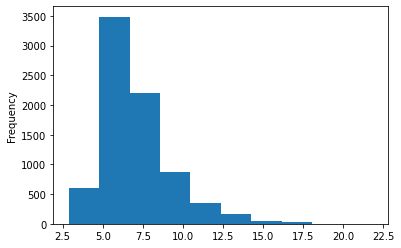

In [132]:
# Next-day average wind speed (m/s) freqency 
df['LDAPS_WS'].plot.hist()

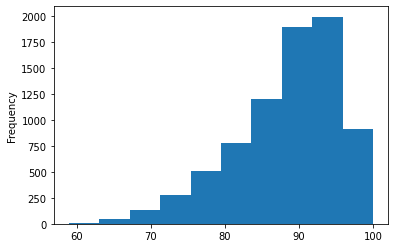

In [133]:
# Maximum Relative Humidity frequency.
df['LDAPS_RHmax'].plot.hist()

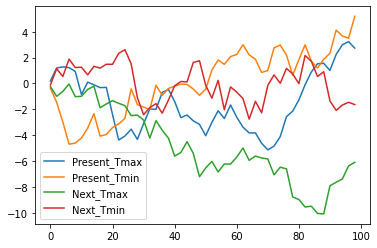

In [134]:
df1 = pd.DataFrame(np.random.randn(50, 4).cumsum(0),
columns=['Present_Tmax', 'Present_Tmin', 'Next_Tmax', 'Next_Tmin'],
index=np.arange(0, 100, 2))
df1.plot()

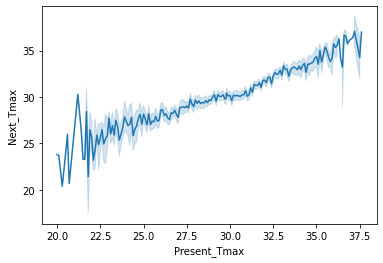

In [135]:
# Present vs Next day Maximum Tempreture
sns.lineplot( x=df["Present_Tmax"], y=df["Next_Tmax"])

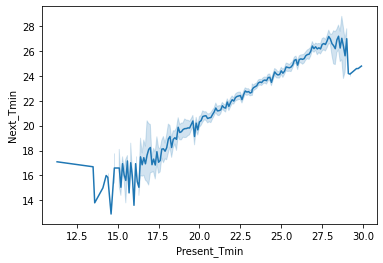

In [136]:
# Present vs Next day Minimum Tempreture
sns.lineplot( x=df["Present_Tmin"], y=df["Next_Tmin"])

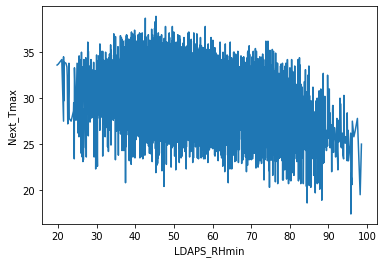

In [137]:
# Next day Tempreture vs  MIN Relative Humidity 
sns.lineplot( x=df["LDAPS_RHmin"], y=df["Next_Tmax"])

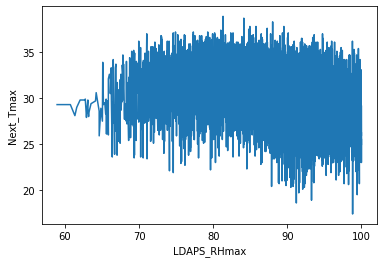

In [138]:
# # Next day Tempreture vs  Max Relative Humidity 
sns.lineplot( x=df["LDAPS_RHmax"], y=df["Next_Tmax"])

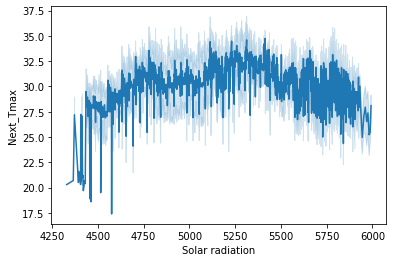

In [139]:
# Daily incoming solar radiation at maximum Tempreture.  
sns.lineplot( x=df["Solar radiation"], y=df["Next_Tmax"])

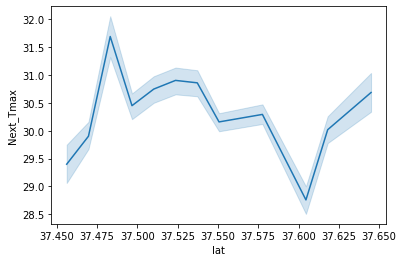

In [140]:
# Latitude vs Next day Maximum Tempreture 
sns.lineplot( x=df["lat"], y=df["Next_Tmax"])

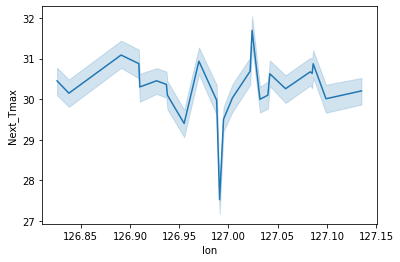

In [141]:
# Longitude vs Next day Maximum Tempreture 
sns.lineplot( x=df["lon"], y=df["Next_Tmax"])

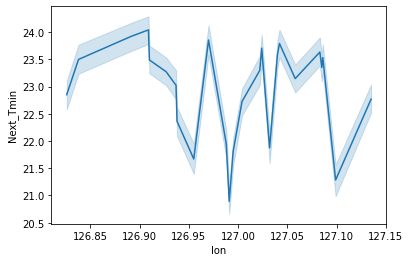

In [142]:
# Longitude vs Next day Min Tempreture
sns.lineplot( x=df["lon"], y=df["Next_Tmin"])

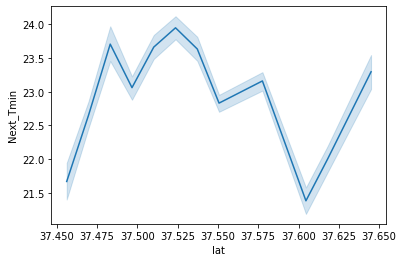

In [143]:
sns.lineplot( x=df["lat"], y=df["Next_Tmin"])

In [144]:
# Next day maximum Tempreture with date and staion wise.
df.pivot_table(index="station", columns="Date", aggfunc={
"Solar radiation":[min, max, "mean"],
"Next_Tmax":"sum"
})

Next_Tmax                        ... Solar radiation                          
               sum                        ...             min                          
Date    2013-06-30 2013-07-01 2013-07-02  ...      2017-08-28   2017-08-29   2017-08-30
station                                   ...                                          
1.0           29.1       24.8       28.1  ...     4692.945313  4654.086426  4614.761230
2.0           30.5       27.3       30.8  ...     4542.624023  4503.431641  4463.794434
3.0           31.1       28.1       31.2  ...     4537.609863  4498.439941  4458.824707
4.0           31.7       27.9       31.3  ...     4527.242188  4488.110840  4448.519043
5.0           31.2       28.2       31.3  ...     4524.760742  4485.424805  4445.645996
6.0           31.5       28.9       31.3  ...     4538.213867  4498.840332  4459.023438
7.0           30.9       27.6       30.0  ...     4519.286621  4480.061523  4440.394043
8.0           31.1       28.2       30.0  ...     4518.488770  4478.937012  4438.943848
9.0           31.3       27.1       30.1  ...     4549.967285  4510.756836  4471.100586
10.0          30.5       27.5       29.4  ...     4454.895508  4413.500000  4371.684570
11.0          31.2       28.9       31.6  ...     4545.048340  4506.012207  4466.529297
12.0          32.6       26.8       31.5  ...     4583.094727  4543.530273  4503.517578
13.0          31.4       28.7       31.6  ...     4513.875488  4474.297363  4434.277832
14.0          31.7       27.9       30.2  ...     4524.740723  4485.437500  4445.691406
15.0          30.8       27.1       30.4  ...     4548.877930  4509.859375  4470.393066
16.0          30.8       27.5       30.1  ...     4486.966309  4446.865723  4406.334473
17.0          31.5       27.8       31.4  ...     4539.616699  4500.299316  4460.537109
18.0          33.1       29.2       32.6  ...     4515.307129  4475.678711  4435.611816
19.0          31.8       27.1       30.5  ...     4574.113770  4535.020020  4495.473633
20.0          30.8       27.3       30.6  ...     4632.916992  4594.163086  4554.965332
21.0          30.6       28.2       30.5  ...     4534.740723  4495.604980  4456.024414
22.0          32.6       29.1       32.5  ...     4520.791504  4481.518555  4441.803711
23.0          31.8       28.1       31.2  ...     4522.184570  4482.970215  4443.313965
24.0          31.3       28.2       30.5  ...     4517.387207  4478.101074  4438.373535
25.0          32.0       28.8       31.0  ...     4530.068848  4490.929199  4451.345215

[25 rows x 1240 columns]

In [145]:
df['Date']=pd.to_datetime(df['Date'])
df.pivot_table(index=pd.Grouper(freq='Y', key="Date"), columns="Solar radiation")

DEM              ...     station            
Solar radiation 4329.520508 4365.431641  ... 5987.718750 5992.895996
Date                                     ...                        
2013-12-31              NaN         NaN  ...         1.0         1.0
2014-12-31              NaN         NaN  ...         1.0         1.0
2015-12-31              NaN         NaN  ...         1.0         1.0
2016-12-31          208.507     82.2912  ...         1.0         NaN
2017-12-31              NaN         NaN  ...         1.0         1.0

[5 rows x 37800 columns]

Checking correlation 

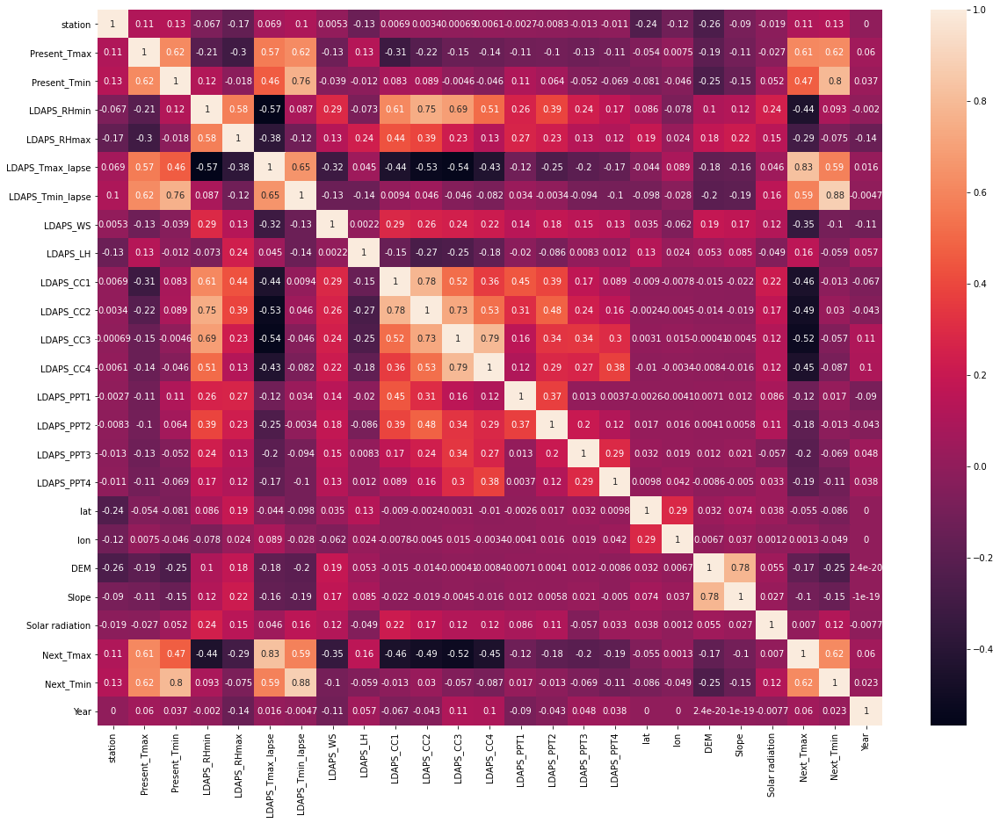

In [147]:

corr_hmap=df.corr()
plt.figure(figsize=(20,15))
sns.heatmap(corr_hmap,annot=True)
plt.show()

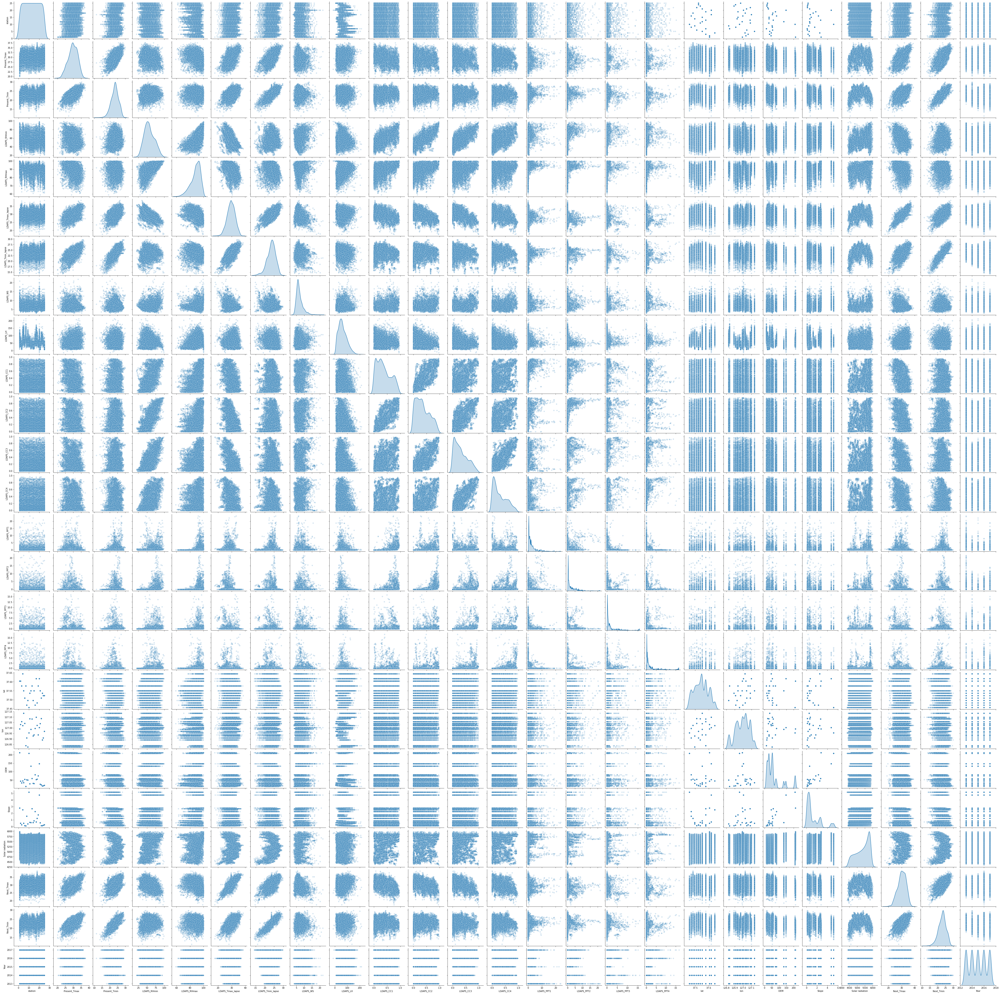

In [148]:
# Pairplots 
sns.pairplot(df, diag_kind='kde', plot_kws={'alpha': 0.2})

In [149]:
from sklearn.preprocessing import LabelEncoder 
  
le = LabelEncoder() 
  
df['Date']= le.fit_transform(df['Date']) 


In [150]:
# Finding and Removing Outliers
from scipy.stats import zscore
z_score=abs(zscore(df))
print(df.shape)
df3=df.loc[(z_score<3).all(axis=1)]
print(df3.shape)

(7750, 26)
(6888, 26)


In [151]:
# Selecting Dependent and Independent variable

X = df3.drop(['Next_Tmax','Next_Tmin'], axis=1)

y = df3[['Next_Tmax','Next_Tmin']]

In [152]:
X,y

(      station  Date  Present_Tmax  ...   Slope  Solar radiation  Year
 0         1.0     0          28.7  ...  2.7850      5992.895996  2013
 1         2.0     0          31.9  ...  0.5141      5869.312500  2013
 2         3.0     0          31.6  ...  0.2661      5863.555664  2013
 3         4.0     0          32.0  ...  2.5348      5856.964844  2013
 4         5.0     0          31.4  ...  0.5055      5859.552246  2013
 ...       ...   ...           ...  ...     ...              ...   ...
 7745     21.0   309          23.1  ...  0.5721      4456.024414  2017
 7746     22.0   309          22.5  ...  0.1332      4441.803711  2017
 7747     23.0   309          23.3  ...  0.1554      4443.313965  2017
 7748     24.0   309          23.3  ...  0.2223      4438.373535  2017
 7749     25.0   309          23.2  ...  0.2713      4451.345215  2017
 
 [6888 rows x 24 columns],       Next_Tmax  Next_Tmin
 0          29.1       21.2
 1          30.5       22.5
 2          31.1       23.9
 3      

In [153]:
# Splits x,y variabble with test and Train 
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 44)

In [154]:
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import r2_score

from math import sqrt

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import KFold

def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [155]:
print("The size of training input is", X_train.shape)
print("The size of training output is", y_train.shape)
print(50 *'*')
print("The size of testing input is", X_test.shape)
print("The size of testing output is", y_test.shape)


The size of training input is (4821, 24)
The size of training output is (4821, 2)
**************************************************
The size of testing input is (2067, 24)
The size of testing output is (2067, 2)


In [156]:

# Using Ridge
params ={'alpha' :[0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000, 10000, 100000]}
ridge_regressor =GridSearchCV(Ridge(), params ,cv =5,scoring = 'neg_mean_absolute_error', n_jobs =-1)
ridge_regressor.fit(X_train ,y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=Ridge(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=None, normalize=False, random_state=None,
                             solver='auto', tol=0.001),
             iid='deprecated', n_jobs=-1,
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000,
                                   10000, 100000]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='neg_mean_absolute_error', verbose=0)

In [157]:
y_train_pred =ridge_regressor.predict(X_train)
y_test_pred =ridge_regressor.predict(X_test)

In [158]:
print(" Results for Ridge Regressor Model:")
print(50 * '-')
print("Root mean squared error: ", sqrt(mse(y_train.values, y_train_pred)))
print("Mean absolute % error: ", round(mean_absolute_percentage_error(y_train.values, y_train_pred)))
print("R-squared: ", r2_score(y_train.values, y_train_pred))

 Results for Ridge Regressor Model:
--------------------------------------------------
Root mean squared error:  1.257390336807895
Mean absolute % error:  4.0
R-squared:  0.7846929220671768


In [159]:
params ={'alpha' :[0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000, 10000, 100000]}
lasso_regressor =GridSearchCV(Lasso(), params ,cv =15,scoring = 'neg_mean_absolute_error', n_jobs =-1)
lasso_regressor.fit(X_train ,y_train)

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5206.08468839339, tolerance: 4.169495300397098
  positive)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2421.2242686179525, tolerance: 2.6736276117879605
  positive)


GridSearchCV(cv=15, error_score=nan,
             estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=1000, normalize=False, positive=False,
                             precompute=False, random_state=None,
                             selection='cyclic', tol=0.0001, warm_start=False),
             iid='deprecated', n_jobs=-1,
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000,
                                   10000, 100000]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='neg_mean_absolute_error', verbose=0)

In [160]:

y_train_pred =lasso_regressor.predict(X_train) 
y_test_pred =lasso_regressor.predict(X_test)

In [161]:
print(" Results for Lasso Regressor Model:")
print(50 * '-')
print("Root mean squared error: ", sqrt(mse(y_train.values, y_train_pred)))
print("Mean absolute % error: ", round(mean_absolute_percentage_error(y_train.values, y_train_pred)))
print("R-squared: ", r2_score(y_train.values, y_train_pred))

 Results for Lasso Regressor Model:
--------------------------------------------------
Root mean squared error:  1.2582043522988724
Mean absolute % error:  4.0
R-squared:  0.7844260904284411


In [162]:

k_range = list(range(1, 30))
params = dict(n_neighbors = k_range)
knn_regressor = GridSearchCV(KNeighborsRegressor(), params, cv =10, scoring = 'neg_mean_squared_error')
knn_regressor.fit(X_train, y_train)

GridSearchCV(cv=10, error_score=nan,
             estimator=KNeighborsRegressor(algorithm='auto', leaf_size=30,
                                           metric='minkowski',
                                           metric_params=None, n_jobs=None,
                                           n_neighbors=5, p=2,
                                           weights='uniform'),
             iid='deprecated', n_jobs=None,
             param_grid={'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                         13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
                                         23, 24, 25, 26, 27, 28, 29]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='neg_mean_squared_error', verbose=0)

In [163]:
y_train_pred =knn_regressor.predict(X_train) 
y_test_pred =knn_regressor.predict(X_test)

In [164]:

print(" Results for KNN Regressor Model:")
print(50 * '-')
print("Root mean squared error: ", sqrt(mse(y_train.values, y_train_pred)))
print("Mean absolute % error: ", round(mean_absolute_percentage_error(y_train.values, y_train_pred)))
print("R-squared: ", r2_score(y_train.values, y_train_pred))

 Results for KNN Regressor Model:
--------------------------------------------------
Root mean squared error:  1.101493448116867
Mean absolute % error:  3.0
R-squared:  0.8316637167803317


In [165]:
depth  =list(range(3,30))
param_grid =dict(max_depth =depth)
D_tree =GridSearchCV(DecisionTreeRegressor(),param_grid,cv =10)
D_tree.fit(X_train,y_train)

/usr/local/lib/python3.6/dist-packages/sklearn/base.py:434: FutureWarning: The default value of multioutput (not exposed in score method) will change from 'variance_weighted' to 'uniform_average' in 0.23 to keep consistent with 'metrics.r2_score'. To specify the default value manually and avoid the warning, please either call 'metrics.r2_score' directly or make a custom scorer with 'metrics.make_scorer' (the built-in scorer 'r2' uses multioutput='uniform_average').
  "multioutput='uniform_average').", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/base.py:434: FutureWarning: The default value of multioutput (not exposed in score method) will change from 'variance_weighted' to 'uniform_average' in 0.23 to keep consistent with 'metrics.r2_score'. To specify the default value manually and avoid the warning, please either call 'metrics.r2_score' directly or make a custom scorer with 'metrics.make_scorer' (the built-in scorer 'r2' uses multioutput='uniform_average').
  "multi

GridSearchCV(cv=10, error_score=nan,
             estimator=DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse',
                                             max_depth=None, max_features=None,
                                             max_leaf_nodes=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             presort='deprecated',
                                             random_state=None,
                                             splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'max_depth': [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14,
                                       15, 16, 17, 18, 19, 20, 21, 22, 23,

In [166]:

y_train_pred =D_tree.predict(X_train)
y_test_pred =D_tree.predict(X_test)

In [167]:
print(" Results for Decision Tree Regressor Model:")
print(50 * '-')
print("Root mean squared error: ", sqrt(mse(y_train.values, y_train_pred)))
print("Mean absolute % error: ", round(mean_absolute_percentage_error(y_train.values, y_train_pred)))
print("R-squared: ", r2_score(y_train.values, y_train_pred))

 Results for Decision Tree Regressor Model:
--------------------------------------------------
Root mean squared error:  0.9210943369999394
Mean absolute % error:  3.0
R-squared:  0.8796449832770975


In [168]:
tuned_params = {'n_estimators': [100, 200, 300, 400, 500], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4]}
random_regressor = RandomizedSearchCV(RandomForestRegressor(), tuned_params, n_iter = 20, scoring = 'neg_mean_absolute_error', cv = 5, n_jobs = -1)
random_regressor.fit(X_train, y_train)

/usr/local/lib/python3.6/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=RandomForestRegressor(bootstrap=True,
                                                   ccp_alpha=0.0,
                                                   criterion='mse',
                                                   max_depth=None,
                                                   max_features='auto',
                                                   max_leaf_nodes=None,
                                                   max_samples=None,
                                                   min_impurity_decrease=0.0,
                                                   min_impurity_split=None,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   n_estimators=100,
                              

In [169]:
y_train_pred = random_regressor.predict(X_train)
y_test_pred = random_regressor.predict(X_test)

In [170]:
print(" Results for Random Forest Regressor Model:")
print(50 * '-')
print("Root mean squared error: ", sqrt(mse(y_train.values, y_train_pred)))
print("Mean absolute % error: ", round(mean_absolute_percentage_error(y_train.values, y_train_pred)))
print("R-squared: ", r2_score(y_train.values, y_train_pred))

 Results for Random Forest Regressor Model:
--------------------------------------------------
Root mean squared error:  0.3295038100318039
Mean absolute % error:  1.0
R-squared:  0.9847953520738726


In [188]:
from sklearn.externals import joblib
joblib.dump(random_regressor,'PROJECT17_MODEL1.pkl')
model1=joblib.load('PROJECT17_MODEL1.pkl')
model1.predict(X_test)

array([[29.6796    , 21.0598    ],
       [25.10319909, 18.42385776],
       [27.0168    , 19.2948    ],
       ...,
       [25.096     , 21.1348    ],
       [30.081     , 21.4372    ],
       [32.16699909, 24.50565776]])

**Finding out From EDA**
* There is a total of 25 sation use for forecasting minimum and maximum daily temperature in  LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea from the year 2013 to 2017  in summer time.
* During that period Present Max Temperature is proportional to next day maximum temperature that means our Next Day Temperature very much depends on present day temperature .
* The Average  Maximum Next day Temperature is recorded 31.693 degrees from station 18  and 31.251 degrees is in the year 2016 and  apart from that the mimimum  was recorded 20.893 from station 1,lowest degree was recorded in 2014. 
* LDAPS_Tmin_lapse & Next_Tmin is highly correlated with 0.88 in datasets among all.
